In [1]:
!pip install ultralytics



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 977.1/977.1 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 52.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
from IPython.core.magic import register_line_cell_magic
import yaml
from PIL import Image
import os
import seaborn as sns
from ultralytics import YOLO
from matplotlib.patches import Rectangle
import glob
import cv2

warnings.filterwarnings("ignore")
np.random.seed(12345)
%matplotlib inline
!wandb disabled

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
W&B disabled.


In [4]:
INPUT_DIR = '/content/drive/MyDrive/construction ml/data'
WORK_DIR = '/content/drive/MyDrive/construction ml/working'

num_classes = 10
classes = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']

dict_file = {'train': os.path.join(INPUT_DIR, 'train'),
             'val': os.path.join(INPUT_DIR, 'valid'),
             'test': os.path.join(INPUT_DIR, 'test'),
             'nc': num_classes,
             'names': classes
            }

with open(os.path.join(WORK_DIR, 'data.yaml'), 'w+') as file:
    yaml.dump(dict_file, file)

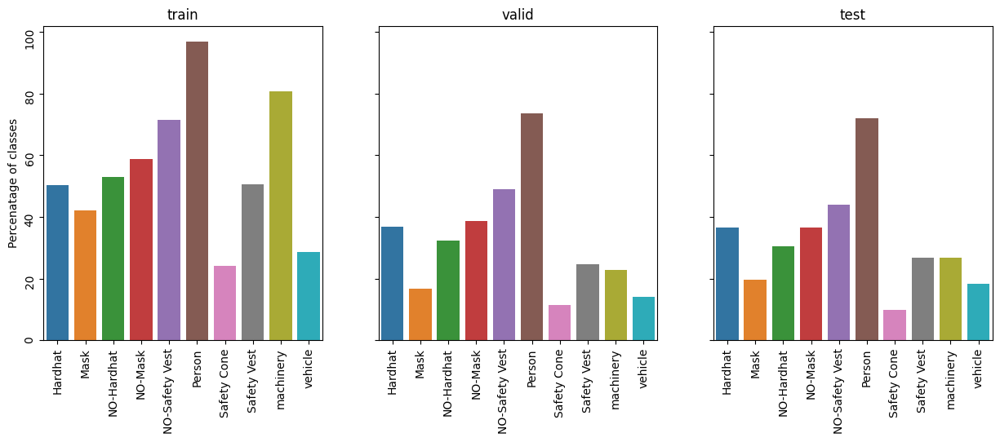

In [5]:
class_idx = {str(i):classes[i] for i in range(num_classes)}

class_stat = {}
data_len = {}

for mode in ['test', 'train', 'valid']:
    class_count = {classes[i]:0 for i in range(num_classes)}
    path = os.path.join(INPUT_DIR, mode, 'labels')
    for file in os.listdir(path):
        with open(os.path.join(path, file)) as f:
            lines = f.readlines()
            for cls in set([line[0] for line in lines]):
                class_count[class_idx[cls]] += 1
    data_len[mode] = len(os.listdir(path))
    class_stat[mode] = class_count

fig, ax = plt.subplots(1,3, figsize=(15, 5), sharey=True)
for i, mode in enumerate(['train', 'valid', 'test']):
    sns.barplot(pd.DataFrame({mode:class_stat[mode]}).T/data_len[mode]*100, ax=ax[i])
    ax[i].set_title(mode)
    ax[i].tick_params(rotation=90)
    ax[i].set_ylabel('Percenatage of classes')
plt.show()

In [6]:
for mode in ['train', 'valid', 'test']:
    print(f'\nImage sizes in {mode} set:\n')
    img_size = 0
    for file in glob.glob(os.path.join(INPUT_DIR, mode, 'images', '*')):
        image = Image.open(file)
        if image.size != img_size:
            print(f'\t{image.size}')
            img_size = image.size

for mode in ['train', 'valid', 'test']:
    files = glob.glob(os.path.join(INPUT_DIR, mode, 'images', '*'))
    print(f'{mode} set size: {len(files)}\n')


Image sizes in train set:

	(640, 640)

Image sizes in valid set:

	(640, 640)

Image sizes in test set:

	(640, 640)
train set size: 2616

valid set size: 114

test set size: 82



In [7]:
model = YOLO('yolov8n.pt')

model.train(data=os.path.join(WORK_DIR, 'data.yaml'),
            task='detect',
            imgsz=640,
            epochs=10,
            batch=32,
            mode='train',
            name='yolov8n_v1_train',
            save_txt=True)

100%|██████████| 6.25M/6.25M [00:00<00:00, 105MB/s]


Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/construction ml/working/data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v1_train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=True, save_conf=False, save_crop=False, sho

100%|██████████| 755k/755k [00:00<00:00, 22.3MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 69.8MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/construction ml/data/train/labels... 2605 images, 17 backgrounds, 0 corrupt: 100%|██████████| 2616/2616 [00:21<00:00, 119.29it/s]

train: WARNING ⚠️ /content/drive/MyDrive/construction ml/data/train/images/004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/construction ml/data/train/images/construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed


train: New cache created: /content/drive/MyDrive/construction ml/data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/construction ml/data/valid/labels... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:02<00:00, 45.47it/s]


val: New cache created: /content/drive/MyDrive/construction ml/data/valid/labels.cache
Plotting labels to runs/detect/yolov8n_v1_train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_v1_train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      5.22G      1.428      2.968       1.53        342        640: 100%|██████████| 82/82 [00:57<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:36<00:00, 18.03s/it]

                   all        114        697      0.745       0.18      0.278      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.76G      1.361        1.9       1.47        251        640: 100%|██████████| 82/82 [00:51<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:33<00:00, 16.96s/it]

                   all        114        697      0.562      0.397      0.456      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.77G      1.314      1.703       1.43        320        640: 100%|██████████| 82/82 [00:53<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:35<00:00, 17.53s/it]

                   all        114        697      0.543      0.439      0.448      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.77G      1.283       1.57      1.402        310        640: 100%|██████████| 82/82 [00:51<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:32<00:00, 16.31s/it]

                   all        114        697      0.607      0.413      0.435      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.77G      1.246      1.463      1.371        245        640: 100%|██████████| 82/82 [00:52<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:28<00:00, 14.07s/it]

                   all        114        697      0.653      0.512      0.553      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.79G      1.205      1.358      1.343        341        640: 100%|██████████| 82/82 [00:52<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:30<00:00, 15.18s/it]

                   all        114        697      0.702      0.557      0.605      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.79G      1.168      1.279      1.314        256        640: 100%|██████████| 82/82 [00:51<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:28<00:00, 14.15s/it]

                   all        114        697      0.725      0.613      0.657      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.79G      1.138      1.215      1.291        300        640: 100%|██████████| 82/82 [00:53<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<00:00, 13.47s/it]

                   all        114        697      0.747      0.601       0.65      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       5.8G      1.104      1.149      1.263        277        640: 100%|██████████| 82/82 [00:51<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:27<00:00, 13.82s/it]

                   all        114        697      0.832      0.595      0.683      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10       5.8G      1.076      1.098      1.247        267        640: 100%|██████████| 82/82 [00:53<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<00:00, 11.84s/it]

                   all        114        697      0.831      0.616      0.696      0.367



10 epochs completed in 0.233 hours.
Optimizer stripped from runs/detect/yolov8n_v1_train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8n_v1_train/weights/best.pt, 6.2MB

Validating runs/detect/yolov8n_v1_train/weights/best.pt...
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<00:00, 12.32s/it]


                   all        114        697      0.845      0.611      0.693      0.366
               Hardhat         42         79      0.949      0.702      0.804      0.477
                  Mask         19         21      0.947      0.843      0.837      0.485
            NO-Hardhat         37         69      0.741      0.464      0.526      0.227
               NO-Mask         44         74      0.741      0.387      0.465      0.205
        NO-Safety Vest         56        106       0.87      0.443      0.598      0.301
                Person         84        166      0.838      0.663       0.77      0.406
           Safety Cone         13         44      0.881      0.773      0.812      0.403
           Safety Vest         28         41      0.859      0.683      0.774      0.436
             machinery         26         55      0.872      0.782       0.85      0.464
               vehicle         16         42      0.754      0.366      0.498      0.261
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e82ed9ddbd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

In [9]:
from google.colab import drive
import shutil
import os

# Save best weights to Google Drive
shutil.copy('runs/detect/yolov8n_v1_train/weights/best.pt', os.path.join('/content/drive/MyDrive/construction ml/saved models', 'yolov8n_v1_best.pt'))

'/content/drive/MyDrive/construction ml/saved models/yolov8n_v1_best.pt'

In [10]:
# Path to saved model in Google Drive
MODEL_PATH = '/content/drive/MyDrive/construction ml/saved models/yolov8n_v1_best.pt'
detection_model = YOLO(MODEL_PATH)

# Load pose model for pose estimation (ensure this pre-trained model is available)
pose_model = YOLO('yolov8n-pose.pt')

# Predict with detection model
results = detection_model.predict(
    source=os.path.join(INPUT_DIR, 'test', 'images'),
    save=False,  # We'll handle saving manually to include hybrid features
    project=os.path.join(WORK_DIR, 'runs'),
    name='predict'
)

# Define the prediction directory (unchanged from your specification)
PREDICTION_DIR = os.path.join(WORK_DIR, 'runs', 'predict')
os.makedirs(PREDICTION_DIR, exist_ok=True)

# Helper function to compute Intersection over Union (IoU)
def compute_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection
    return intersection / union if union > 0 else 0

# Helper function to check if the center of one box is inside another
def is_center_inside(box1, box2):
    cx = (box1[0] + box1[2]) / 2
    cy = (box1[1] + box1[3]) / 2
    return box2[0] < cx < box2[2] and box2[1] < cy < box2[3]

# Helper function to draw bounding boxes
def draw_box(img, box, color, thickness=2):
    x1, y1, x2, y2 = map(int, box)
    cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)

# Helper function to draw keypoints
def draw_keypoints(img, keypoints, color=(0, 255, 0)):
    for kp in keypoints:
        if kp[2] > 0.5:  # Confidence threshold
            x, y = map(int, kp[:2])
            cv2.circle(img, (x, y), 5, color, -1)

# Process each prediction result with the hybrid model
for result in results:
    image = result.orig_img.copy()  # Work with a copy of the original image

    # Get detections from the detection model
    det_boxes = result.boxes.xyxy.cpu().numpy()
    det_classes = result.boxes.cls.cpu().numpy()
    det_conf = result.boxes.conf.cpu().numpy()

    # Run pose model on the same image
    pose_results = pose_model(image)
    pose_boxes = pose_results[0].boxes.xyxy.cpu().numpy()
    pose_keypoints = pose_results[0].keypoints.data.cpu().numpy()

    # Identify person detections from the detection model
    person_indices = [i for i, cls in enumerate(det_classes) if cls == classes.index('Person')]

    # Process each detected person
    for idx in person_indices:
        person_box = det_boxes[idx]

        # Associate with pose estimation
        max_iou = 0
        associated_keypoints = None
        for j, pose_box in enumerate(pose_boxes):
            iou = compute_iou(person_box, pose_box)
            if iou > max_iou:
                max_iou = iou
                associated_keypoints = pose_keypoints[j]

        if max_iou > 0.5 and associated_keypoints is not None:
            # Draw keypoints for the person
            draw_keypoints(image, associated_keypoints)

        # Check for associated safety equipment
        has_hardhat = False
        has_mask = False
        has_vest = False
        for k, box in enumerate(det_boxes):
            if det_classes[k] == classes.index('Hardhat') and is_center_inside(box, person_box):
                has_hardhat = True
            elif det_classes[k] == classes.index('Mask') and is_center_inside(box, person_box):
                has_mask = True
            elif det_classes[k] == classes.index('Safety Vest') and is_center_inside(box, person_box):
                has_vest = True

        # Color-code person based on safety compliance
        color = (0, 255, 0) if has_hardhat and has_mask and has_vest else (0, 0, 255)  # Green for compliant, red for non-compliant
        draw_box(image, person_box, color)

    # Draw bounding boxes for non-person objects (e.g., machinery, cones)
    for i, box in enumerate(det_boxes):
        if i not in person_indices:
            draw_box(image, box, (255, 0, 0))  # Blue for other objects

    # Save the enhanced image
    save_path = os.path.join(PREDICTION_DIR, os.path.basename(result.path))
    cv2.imwrite(save_path, image)

100%|██████████| 6.52M/6.52M [00:00<00:00, 124MB/s]



image 1/82 /content/drive/MyDrive/construction ml/data/test/images/-4405-_png_jpg.rf.82b5c10b2acd1cfaa24259ada8e599fe.jpg: 640x640 1 Hardhat, 1 Person, 7.8ms
image 2/82 /content/drive/MyDrive/construction ml/data/test/images/000005_jpg.rf.96e9379ccae638140c4a90fc4b700a2b.jpg: 640x640 2 Hardhats, 2 NO-Masks, 1 Person, 1 machinery, 7.4ms
image 3/82 /content/drive/MyDrive/construction ml/data/test/images/002551_jpg.rf.ce4b9f934161faa72c80dc6898d37b2d.jpg: 640x640 2 Hardhats, 1 NO-Mask, 3 NO-Safety Vests, 3 Persons, 7.4ms
image 4/82 /content/drive/MyDrive/construction ml/data/test/images/003357_jpg.rf.9867f91e88089bb68dc95947d5116d14.jpg: 640x640 1 Safety Cone, 7.4ms
image 5/82 /content/drive/MyDrive/construction ml/data/test/images/004063_jpg.rf.1b7cdc4035bcb24ef69b8798b444053e.jpg: 640x640 5 Hardhats, 5 NO-Safety Vests, 6 Persons, 2 Safety Vests, 7.4ms
image 6/82 /content/drive/MyDrive/construction ml/data/test/images/004763_jpg.rf.46484e6ca73caeaa9de45822cf1085a9.jpg: 640x640 3 Hardhat

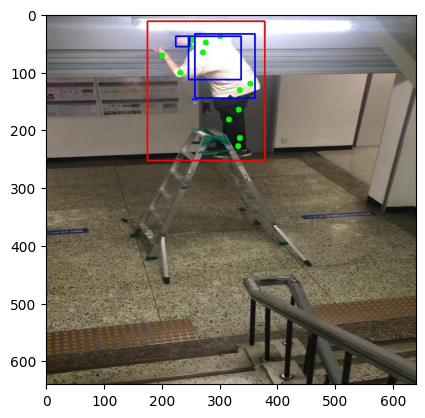

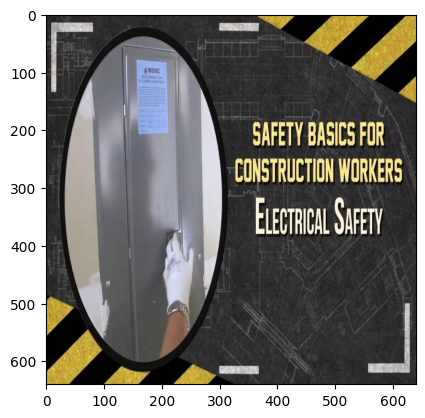

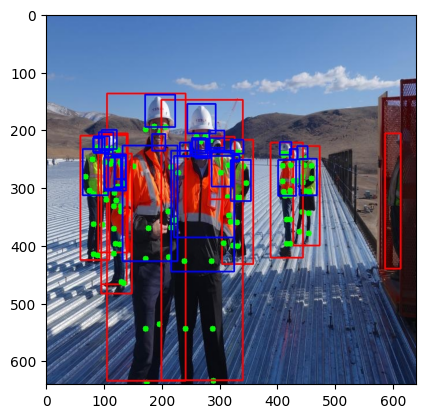

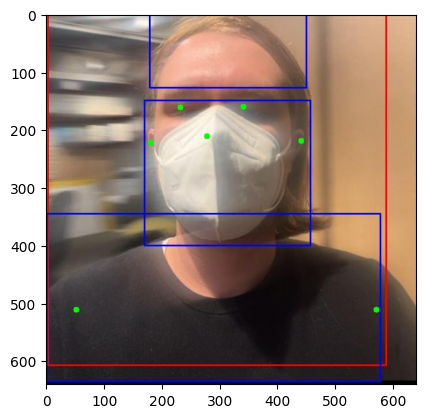

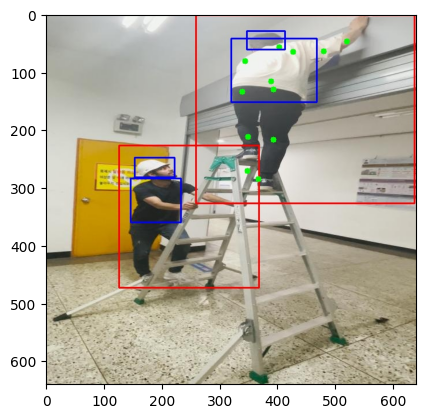

...

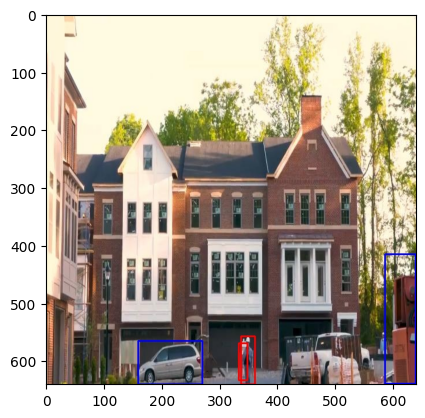

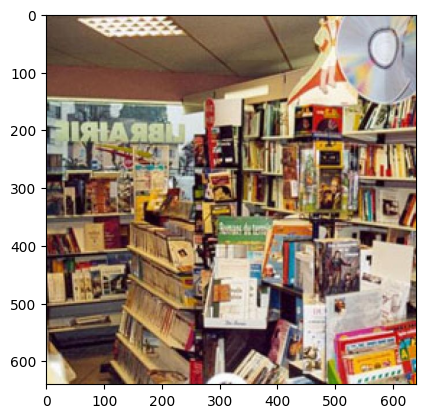

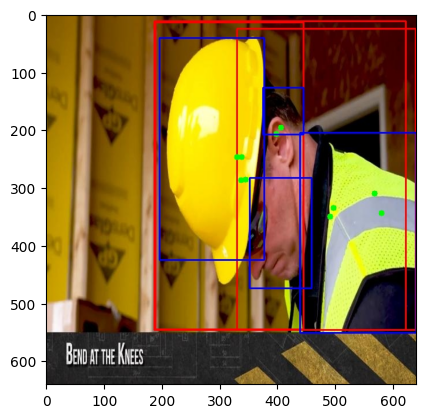

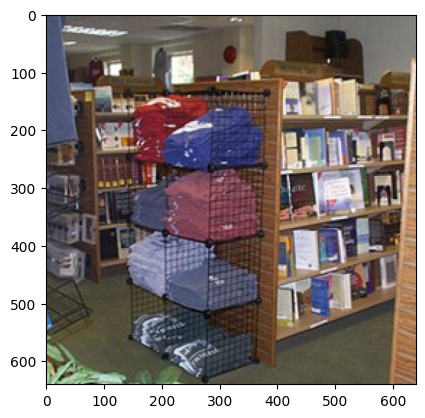

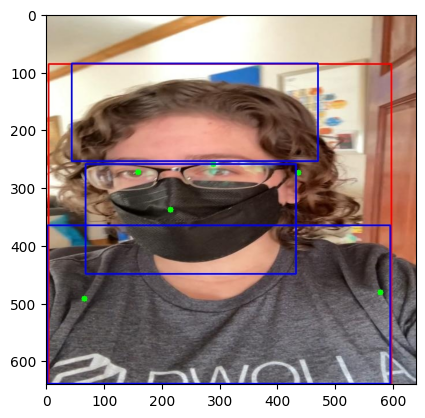

In [12]:
# Define the path where predictions are expected
PREDICTION_DIR = os.path.join(WORK_DIR, 'runs', 'predict')

# Verify predictions folder
predictions = glob.glob(os.path.join(PREDICTION_DIR, '*'))

if predictions:
    n = 40
    for i in range(n):
        idx = np.random.randint(0, len(predictions))
        image = Image.open(predictions[idx])
        plt.imshow(image)
        plt.grid(False)
        plt.show()
else:
    print("No prediction images found in the specified directory.")